In [71]:
import requests
import json
import matplotlib.pyplot as plt
import datetime
import numpy as np
import folium


In [103]:
SANANDREAS_LATITUDE = 35.1167
SANANDREAS_LONGITUDE = -119.6500

def fetch_earthquake_data(latitude, longitude, start_string, end_string, magnitude, max_radius_km):
    base_url = "https://earthquake.usgs.gov/fdsnws/event/1/query"
    params = {
        "format": "geojson",
        'latitude': latitude,
        'longitude': longitude,
        'maxradiuskm': max_radius_km,
        "starttime": start_string,
        "endtime": end_string,
        "minmagnitude": magnitude,
        "orderby": "time"
    }
    response = requests.get(base_url, params=params)
    if response.status_code == 200:
        data = response.json()
        return data
    else:
        print("Failed to fetch earthquake data.")
        return None

In [130]:
all_the_data = []
run = False
if run:
    import aiohttp
    import asyncio
    from datetime import datetime, timedelta

    SANANDREAS_LATITUDE = 35.1167
    SANANDREAS_LONGITUDE = -119.6500

    async def fetch_earthquake_data(session, latitude, longitude, start_string, end_string, magnitude, max_radius_km):
        base_url = "https://earthquake.usgs.gov/fdsnws/event/1/query"
        params = {
            "format": "geojson",
            'latitude': latitude,
            'longitude': longitude,
            'maxradiuskm': max_radius_km,
            "starttime": start_string,
            "endtime": end_string,
            "minmagnitude": magnitude,
            "orderby": "time"
        }
        async with session.get(base_url, params=params) as response:
            if response.status != 200:
                print(f"Failed to fetch earthquake data for {start_string} to {end_string}.")
                print(response.text)
                return None
            data = await response.json()
            return data

    async def main():
        today = datetime.today()
        start_date = datetime.strptime("2010-01-01", "%Y-%m-%d")
        time_delta = timedelta(days=365)
        end_date = start_date + time_delta

        tasks = []
        
        async with aiohttp.ClientSession() as session:
            while end_date < today:
                start_string = start_date.strftime("%Y-%m-%d")
                end_string = end_date.strftime("%Y-%m-%d")
                task = fetch_earthquake_data(session, SANANDREAS_LATITUDE, SANANDREAS_LONGITUDE, start_string, end_string, 1.0, 500)
                tasks.append(task)
                start_date = end_date
                end_date = end_date + timedelta(days=365)
            
            # Run all tasks concurrently
            all_the_data = await asyncio.gather(*tasks)
        
        return all_the_data

    # Run the main function in Jupyter Notebook
    earthquake_data = await main()


{'type': 'FeatureCollection',
 'metadata': {'generated': 1731886454000,
  'url': 'https://earthquake.usgs.gov/fdsnws/event/1/query?format=geojson&latitude=35.1167&longitude=-119.65&maxradiuskm=500&starttime=2010-01-01&endtime=2010-04-11&minmagnitude=1.0&orderby=time',
  'title': 'USGS Earthquakes',
  'status': 200,
  'api': '1.14.1',
  'count': 10591},
 'features': [{'type': 'Feature',
   'properties': {'mag': 1.27,
    'place': '17km WNW of Progreso, B.C., MX',
    'time': 1270943915770,
    'updated': 1457605760255,
    'tz': None,
    'url': 'https://earthquake.usgs.gov/earthquakes/eventpage/ci37208645',
    'detail': 'https://earthquake.usgs.gov/fdsnws/event/1/query?eventid=ci37208645&format=geojson',
    'felt': None,
    'cdi': None,
    'mmi': None,
    'alert': None,
    'status': 'reviewed',
    'tsunami': 0,
    'sig': 25,
    'net': 'ci',
    'code': '37208645',
    'ids': ',ci37208645,',
    'sources': ',ci,',
    'types': ',nearby-cities,origin,phase-data,',
    'nst': 11,

In [74]:
def parse_earthquake_data(data):
    earthquakes = []

    for feature in data['features']:
        properties = feature['properties']
        magnitude = properties['mag']
        timestamp = datetime.datetime.fromtimestamp(properties['time'] / 1000.0)

        coordinates = feature['geometry']['coordinates']
        longitude = coordinates[0]
        latitude = coordinates[1]

        earthquakes.append({
            'magnitude': magnitude,
            'timestamp': timestamp,
            'longitude': longitude,
            'latitude': latitude

        })

    return earthquakes

earthquakes = parse_earthquake_data(earthquake_data)

In [75]:
locations = []
for quake in earthquakes:
    location = (quake['latitude'],quake['longitude'],quake['magnitude'])
    locations.append(
        location
    )
locations 

[(33.0181667, -117.9088333, 1.98),
 (38.7796667, -122.7666667, 1.35),
 (36.591, -121.1973333, 2.03),
 (34.0071667, -116.3228333, 1.72),
 (38.8286667, -122.8151703, 1.04),
 (35.714, -117.549, 1.85),
 (38.8311653, -122.8178329, 1.09),
 (38.7823334, -122.7453308, 1.08),
 (36.869, -121.338, 1.02),
 (38.7926667, -122.7471667, 1.04),
 (38.8058333, -122.8111667, 1.21),
 (36.6203333, -120.593, 1.79),
 (34.0885, -118.6328333, 1.87),
 (33.0411667, -114.96, 1.57),
 (37.9875, -122.4535, 1.14),
 (34.381, -119.177, 1.69),
 (36.7465, -121.5966667, 1.85),
 (37.5055, -119.3685, 1.51),
 (38.65, -122.3728333, 1.49),
 (33.0465, -116.3586667, 1.16),
 (34.2048333, -117.5376667, 1.27),
 (37.1828, -114.9686, 1.6),
 (34.888, -118.7573333, 1.17),
 (32.9665, -115.8608333, 2.79),
 (38.5234, -119.529, 1.5),
 (36.954, -121.6393333, 2.04),
 (32.9926667, -117.9413333, 1.63),
 (38.4155, -119.3237, 1.4),
 (34.1928333, -117.5131667, 1.31),
 (33.6011667, -116.7205, 1),
 (37.0259, -116.7339, 1.7),
 (33.597, -116.7228333, 

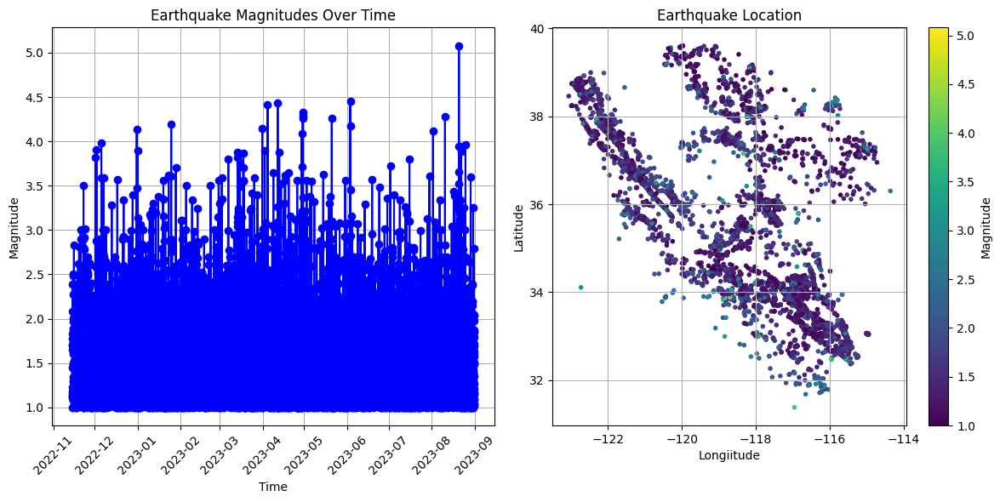

In [76]:
def plot_earthquake_magnitudes(earthquakes):
    timestamps = [quake['timestamp'] for quake in earthquakes]
    magnitudes = [quake['magnitude'] for quake in earthquakes]
    latitude = [quake['latitude'] for quake in earthquakes]
    longitude = [quake['longitude'] for quake in earthquakes]
   

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(timestamps, magnitudes, marker='o', linestyle='-', color='b')
    plt.title('Earthquake Magnitudes Over Time')
    plt.xlabel('Time')
    plt.ylabel('Magnitude')
    plt.grid(True)
    plt.xticks(rotation=45)
   
    plt.subplot(1, 2, 2)
    scatter = plt.scatter(longitude, latitude, c=magnitudes, cmap='viridis', marker='.')
    plt.title('Earthquake Location')
    plt.xlabel('Longiitude')
    plt.ylabel('Latitude')
    plt.colorbar(label='Magnitude')
    plt.grid(True)

    plt.tight_layout()
    plt.show


plot_earthquake_magnitudes(earthquakes)

In [77]:
mymap = folium.Map(location=[35.0, -118.5], zoom_start=8) 

for lat, lon,mag in locations:
    folium.CircleMarker(
        location=[lat, lon],
        radius=2*mag,      
        color='red',   
        fill=True,      
        fill_color='red',
        fill_opacity=0.8,
        tooltip=folium.Tooltip(mag)
    ).add_to(mymap)
mymap